# LightGBM tuning experiment

The initial idea was to get a small unbalanced and not very predictable dataset and try to measure an effect of LightGBM parameter tuning on classification metrics by running a long random search in a large parameter space.

TLDR (on a single small dataset):

* lgb.Dataset is stateful, need to create one from scratch before training model with new parameters
* early stopping is considered harmful (unstable, overestimates metrics)
* some parameter values stop model from convergence (thanks, captain)
* most of the parameters don't affect each other (only several pairs do)

See README at https://github.com/mabrek/lightgbm-tuning for code and steps to reproduce.

In [1]:
import glob

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import matplotlib
%matplotlib inline

from pylab import rcParams

from lightgbm_tuning import read_json_log, summarize_logs, METRICS, \
    CONT_PARAMETERS, LOG_PARAMETERS, SET_PARAMETERS, INT_PARAMETERS,\
    read_full_logs

In [2]:
rcParams['figure.figsize'] = 20, 5
pd.set_option('display.max_columns', None)

In [3]:
%load_ext autoreload
%autoreload 2

### Read experiment logs and preprocess metrics

In [4]:
# first of all, generate some data by running search-telecom-churn.py, logs are not included here due to their size
# process logs, very slow
#df = summarize_logs(read_json_log('./experiments/wide.log'))
#df.write_pickle('./experiments/wide.pkl')

### Dependencies between classification metrics on CV

In [5]:
# read preprocessed data (not included in repository)
narrow = pd.read_pickle('./experiments/narrow.pkl')

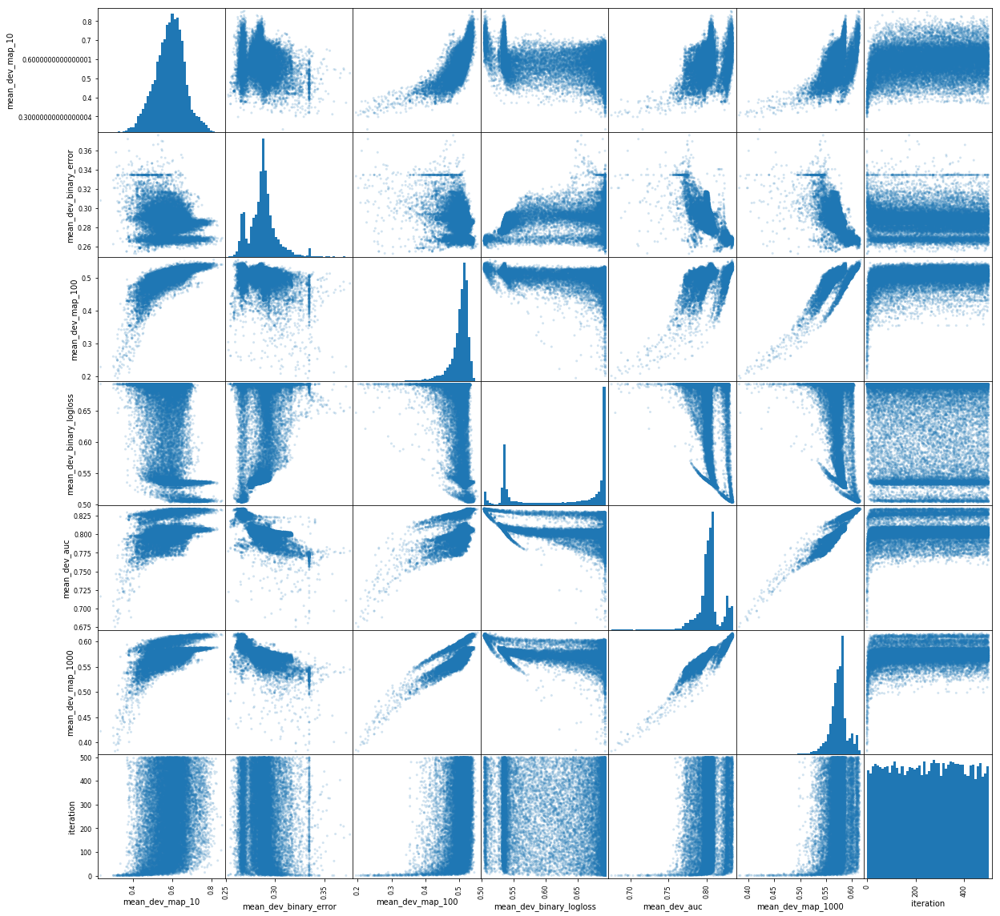

In [6]:
pd.plotting.scatter_matrix(
    narrow[['mean_dev_' + m for m in set(METRICS) - set(['kldiv'])] + ['iteration']].sample(25000), 
    alpha=0.2, figsize=(20, 20), hist_kwds={'bins': 50});

MAP@10 has bad correlation with AUC (optimizing AUC doesn't help if you only need top 10 items), MAP@1000 correlates much better.

### Don't do early stopping

In [7]:
# slow
#folds = unfold_iterations(next(read_json_log('./experiments/wide.log', chunksize=2500)))
#folds.to_pickle('./experiments/wide-folds.pkl')

In [8]:
folds = pd.read_pickle('./experiments/wide-folds.pkl')
cv_folds = folds[folds.split >= 0]
experiment = cv_folds[(cv_folds.experiment_id == 407) & (cv_folds.param_seed == 33957)]

early stopping per fold overestimates AUC:

In [9]:
experiment.groupby('split').dev_auc.max().mean()

0.8109245866471861

better to average folds per iteration:

In [10]:
experiment.groupby('iteration').dev_auc.mean().max()

0.8095165924982167

location of maximums per each fold are too different:

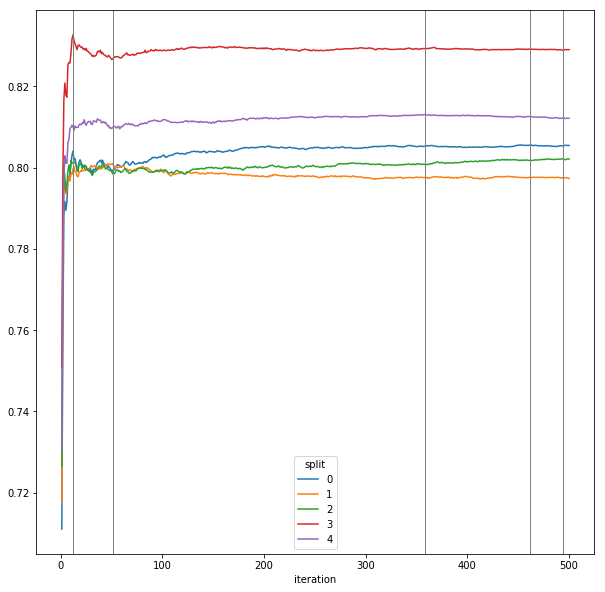

In [11]:
ax = experiment.pivot(index='iteration', columns='split', values='dev_auc').plot(figsize=(10, 10));
for x in experiment.pivot(index='iteration', columns='split', values='dev_auc').idxmax():
    ax.axvline(x=x, color='gray', linewidth=1)

sad trombone, maximum locations found on CV folds are wrong on validation set:

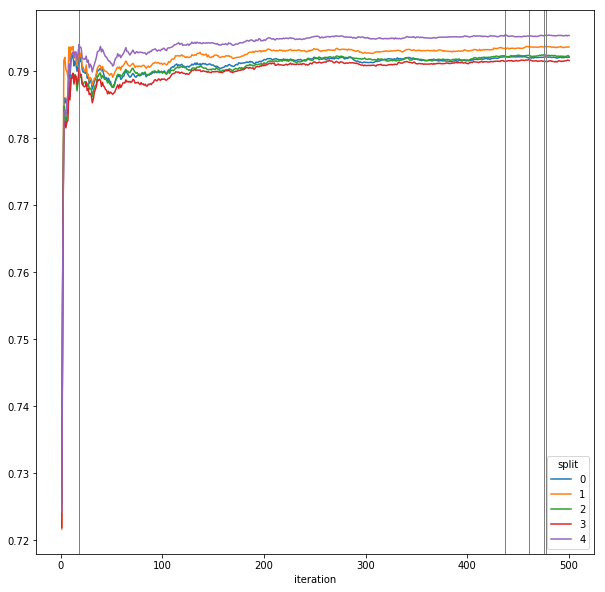

In [12]:
ax = experiment.pivot(index='iteration', columns='split', values='validation_auc').plot(figsize=(10, 10));
for x in experiment.pivot(index='iteration', columns='split', values='validation_auc').idxmax():
    ax.axvline(x=x, color='gray', linewidth=1)

logloss doesn't stop while auc hits the limit:

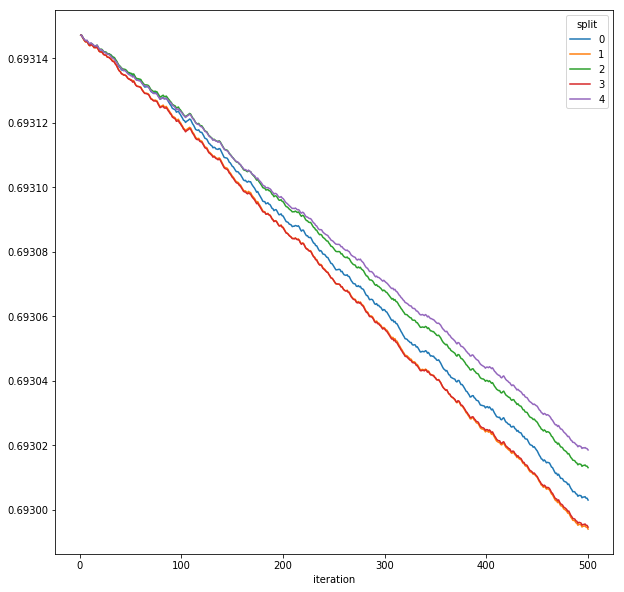

In [13]:
experiment.pivot(index='iteration', columns='split', values='dev_binary_logloss').plot(figsize=(10, 10));

Don't even try to use early stopping on several metrics at once (like logloss + auc), logloss could be weird

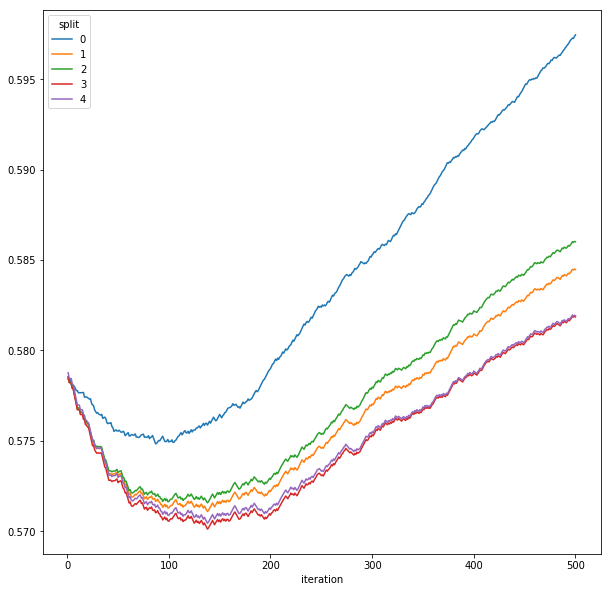

In [14]:
weird_logloss = cv_folds[(cv_folds.experiment_id == 182) & (cv_folds.param_seed == 86723)]
weird_logloss.pivot(index='iteration', columns='split', values='dev_binary_logloss').plot(figsize=(10, 10));

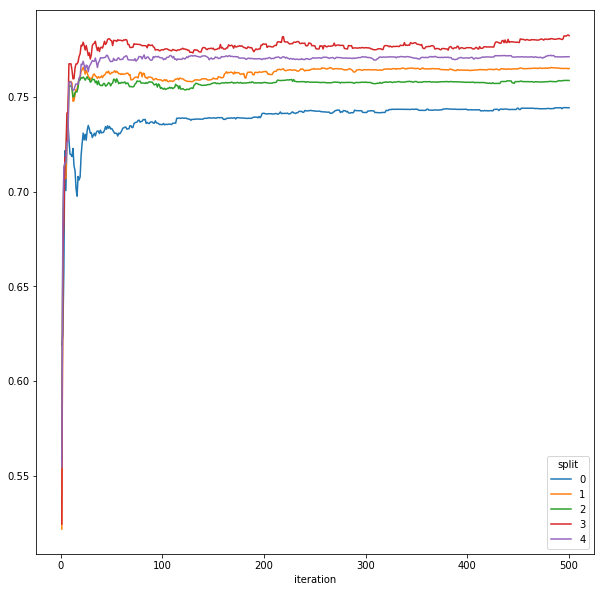

In [15]:
weird_logloss.pivot(index='iteration', columns='split', values='dev_auc').plot(figsize=(10, 10));

In [16]:
del folds, cv_folds, experiment, weird_logloss

### Check global effect of parameters on ROC AUC

X axis range corresponds to parameter range in random search space. More points means more experiments landed in this area.

In [4]:
df = pd.read_pickle('./experiments/wide-20shuffle-3seed.pkl')
good = df[df.mean_dev_auc > 0.70].copy()

Disabled bagging `bagging_freq: 0` produces more good results than enabled:

In [5]:
(good.param_bagging_freq == 0).value_counts()

True     190609
False    128284
Name: param_bagging_freq, dtype: int64

It's better to set `is_unbalance` than trying to find good class weight:

In [6]:
good.param_is_unbalance.value_counts()

True     232217
False     86676
Name: param_is_unbalance, dtype: int64

Top AUC could be reached using small number of iterations (deceptive):

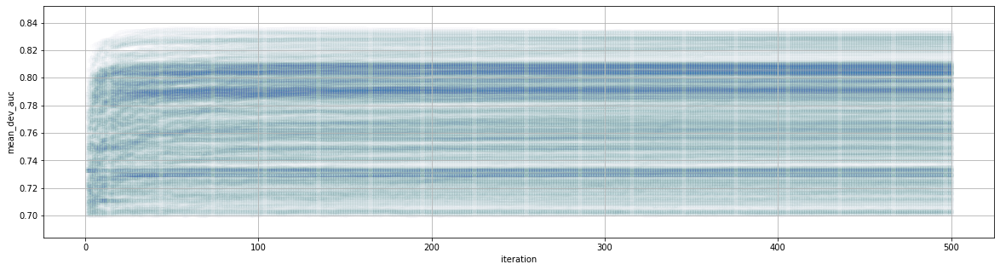

In [7]:
good.plot(x='iteration', y='mean_dev_auc', kind='scatter', alpha=0.006, grid=True);

High `min_data_in_leaf` is bad (thanks captain, dataset size is only 7000, split into 6 parts):

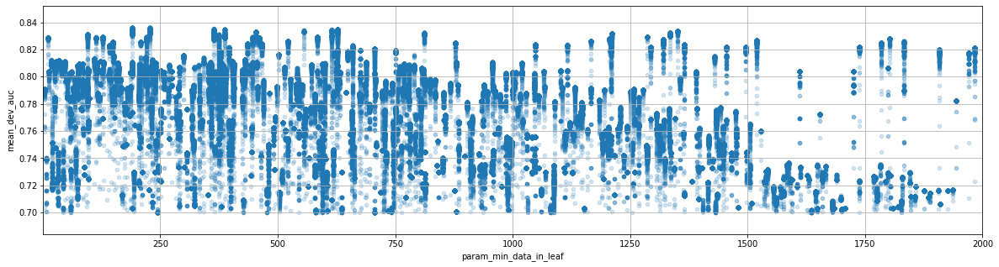

In [8]:
good.plot(x='param_min_data_in_leaf', y='mean_dev_auc', kind='scatter', alpha=0.2, 
        grid=True, xlim=(1, 2000));

same for `min_data_in_bin`:

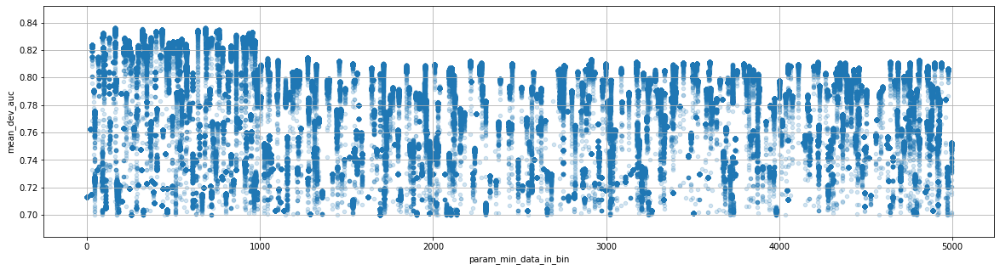

In [9]:
good.plot(x='param_min_data_in_bin', y='mean_dev_auc', kind='scatter', alpha=0.2, grid=True);

Don't set `lambda_l1` too large (AUC == 0.5 for lambda_l1 > 1e3)

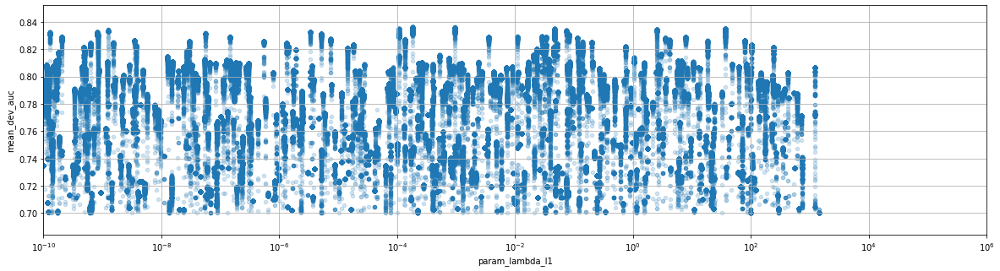

In [10]:
good.plot(x='param_lambda_l1', y='mean_dev_auc', kind='scatter', alpha=0.2, logx=True, grid=True,
         xlim=(1e-10, 1e6));

same for `min_sum_hessian_in_leaf`, `min_gain_to_split`

### Interaction between parameters

In [11]:
good_max = good.sort_values('mean_dev_auc').groupby('experiment_id').last()

don't strain your eyes, larger versions are below

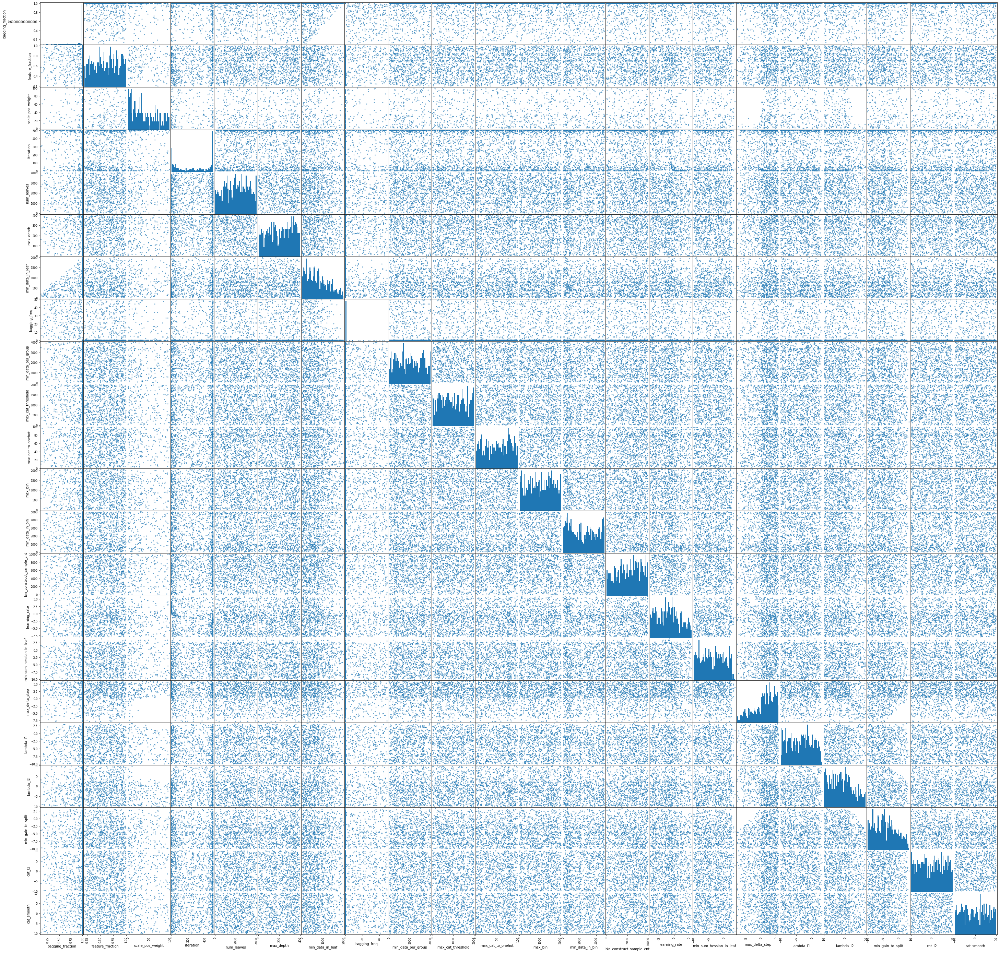

In [12]:
pd.plotting.scatter_matrix(
    pd.concat([good_max[CONT_PARAMETERS + INT_PARAMETERS], 
               np.log10(good_max[LOG_PARAMETERS])],
              axis='columns',
              sort=True
             ).rename(lambda x: x.replace('param_', ''), axis='columns'),
    alpha=0.7, figsize=(50, 50), hist_kwds={'bins': 50});

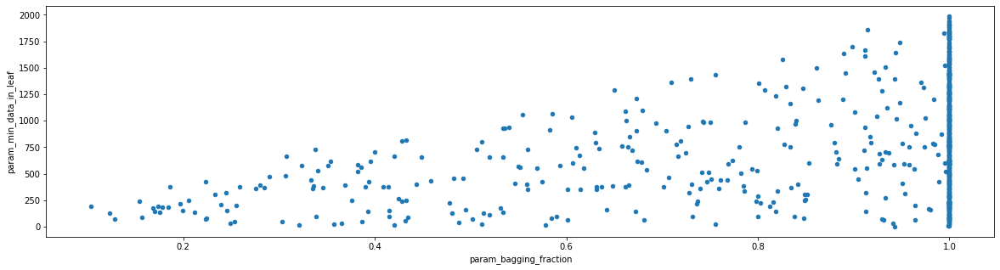

In [13]:
good_max.plot(x='param_bagging_fraction', y='param_min_data_in_leaf', kind='scatter');

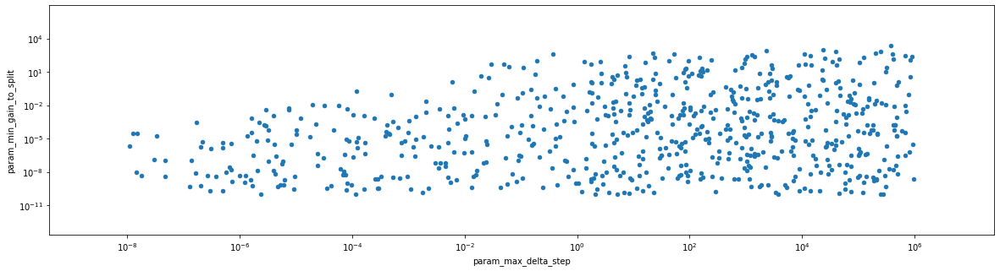

In [14]:
good_max.plot(x='param_max_delta_step', y='param_min_gain_to_split', kind='scatter', logx=True, logy=True);

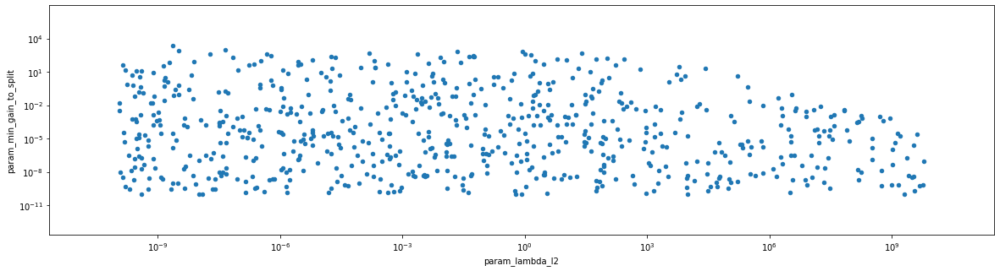

In [15]:
good_max.plot(x='param_lambda_l2', y='param_min_gain_to_split', kind='scatter', logx=True, logy=True);

no clearly visible dependency between learning_rate and iteration (but hold on for a while, there will be one in folowing parts)

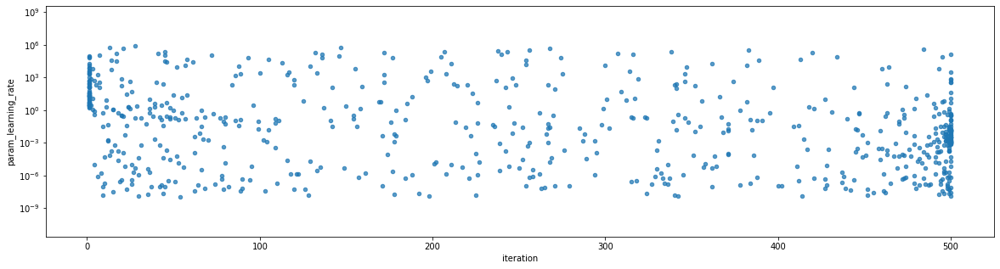

In [16]:
good_max.plot(x='iteration', y='param_learning_rate', kind='scatter', logy=True, alpha=0.75);